| Assignment 1 contribution table   | Andreas Holm Matthiassen (s234838) | Hector Helt Jakobsen (s234822) | Teis Aggerholm (s234822) |
|-------------|---------|---------|---------|
| Part 1 | 100%     | 0%     | 0%     |
| Part 2 | 0%     | 100%     | 0%     |
| Part 3 | 0%     | 0%     | 100%     |

Link to our GitHub repository: `https://github.com/Andreas-Holm-2/02467-Assignment-2`

# `Part 1:` Properties of the real-world network of Computational Social Scientists


Exercise: Analyzing Networks through a Random Model
1. _Random Network_: Let's start by building a Random Network, acting as a baseline (or [\"null model\"](https://en.wikipedia.org/wiki/Null_model)) to understand the Computational Social Scientists Network better.

* First, calculate the probability (_p_) that makes the expected number of edges in our random network match the actual edge count in the Computational Social Scientists network. Refer to equation 3.2 in your Network Science textbook for guidance. After finding _p_, figure out the average degree (using the given formula).

In [1]:
N = 17833 # Total Nodes (authors) found in the week 4 exercises
L = 58544 # Total links (collaborations) found in the week 4 exercises

From the Network Science textbook, we have

$$
\langle L\rangle=\sum_{\mathrm{L}=0}^{\frac{\mathrm{N}(\mathrm{~N}-1)}{2}} \mathrm{Lp}_{\mathrm{L}}=\mathrm{p} \frac{\mathrm{~N}(\mathrm{~N}-1)}{2} \quad (3.2)
$$

Using this equation, we can derive a formula to calculate the probability (p) that makes the expected number of edges in our random network match the actual edge count in the Computational Social Scientists network

$$
\langle L\rangle = p \frac{N(N-1)}{2} \Leftrightarrow \frac {\langle L\rangle} {\frac{N(N-1)}{2}} = p \Leftrightarrow \frac {2 \langle L\rangle} {N(N-1)} = p
$$

Now using the formula to calculate $p$:

In [2]:
p = 2 * L / (N * (N-1))
p

0.0003682035087661039

Thus, $p \approx 0.00037$. This ensures expected number of edges in our random network match the actual edge count in the Computational Social Scientists network.


Now we use this p to calculate the expected average degree $\langle\mathrm{k}\rangle$:

$$
\langle\mathrm{k}\rangle=\frac{2\langle\mathrm{L}\rangle}{\mathrm{N}}=\mathrm{p}(\mathrm{~N}-1)
$$

In [3]:
avg_degree = p * (N-1)
avg_degree

6.565804968317165

The average degree is $\approx 6.57$

* Now, write a function to generate a Random Network that mirrors the Computational Social Scientists network in terms of node count, using your calculated _p_. Generate a random network by linking nodes in every possible pair with probability _p_. **Hint**: you can use the function [``np.random.uniform``](https://numpy.org/doc/stable/reference/random/generated/numpy.random.uniform.html) to draw samples from a uniform probability distribution.

In [4]:
import networkx as nx
import numpy as np

def generate_random_network(N, p):
    '''
    Funtion to generate a random network given with the same number of nodes and the same calculated value of p, which was found in the co-authorship network
    '''
    np.random.seed(0) # to ensure reproduceability 

    G = nx.Graph()
    G.add_nodes_from(range(N))

    for i in range(N):
        for j in range(i + 1, N):
            if np.random.uniform(0, 1) < p:
                G.add_edge(i, j)

    return G

The above function generates a Random Network that mirrors the Computational Social Scientists network in terms of node count, using the calculated $p$.

The function however, is very inefficient due to $O(n^2)$ time complexity, and for `n=17833` the network took approximately 3 minutes to generate.

For this reason, I will be utilizing the built-in Erdos-Renyi generator function in the NetworkX library to generate the Erdos-Renyi network.

In [5]:
import networkx as nx
import numpy as np

def generate_random_network(N, p):
    '''
    (function documentation: https://networkx.org/documentation/stable/reference/generated/networkx.generators.random_graphs.fast_gnp_random_graph.html)
    
    Note a seed=0 is included to ensure reproduceability
    '''
    
    G = nx.fast_gnp_random_graph(N, p, seed=0)

    return G

N = 17833 
L = 58544  
p = (2 * L) / (N * (N - 1))  

random_network = generate_random_network(N, p)
print(random_network) # security check
print()
print("Succesfully generated the random network")

Graph with 17833 nodes and 58750 edges

Succesfully generated the random network


In addition to generating the random network, i will be loading the Computational Social Scientists network, which will be used in the next exercise

In [6]:
import ast
from collections import defaultdict
import pandas as pd

def load_coauthorship_network():
    
    papers_df = pd.read_csv("final_paperdata.csv")

    coauthor_counts = defaultdict(int)

    all_author_ids = set()
    for author_list in papers_df['author_ids'].dropna():
        authors = ast.literal_eval(author_list)
        all_author_ids.update(authors)
        
        for i in range(len(authors)):
            for j in range(i + 1, len(authors)):
                coauthor_counts[(authors[i], authors[j])] += 1

    weighted_edgelist = [(a, b, w) for (a, b), w in coauthor_counts.items()]

    weighted_edgelist[:5]

    G = nx.Graph()
    G.add_nodes_from(all_author_ids)
    G.add_weighted_edges_from(weighted_edgelist)

    return G

coauthorship_network = load_coauthorship_network()
print(coauthorship_network) # security check

Graph with 17833 nodes and 58544 edges


* Visualize the network as you did for the Computational Social Scientists network in the exercise above (my version is below).

In [7]:
'''
We use the Netwulf library created by Ulf Aslak and Ben Maier for visualizing the two networks.

Please note the visualzation settings are completely the same for both networks (ensuring reproduceability) with the only exception being
the node color (for easier distinction).
'''
import netwulf as nw
import matplotlib.pyplot as plt


### Random network visualization:

In [ ]:
largest_cc_random_network = max(nx.connected_components(random_network), key=len)
largest_cc_random_network_subgraph = random_network.subgraph(largest_cc_random_network).copy()

print(f"Original network: {random_network.number_of_nodes()} nodes, {random_network.number_of_edges()} edges")
print(f"Largest Connected Component: {largest_cc_random_network_subgraph.number_of_nodes()} nodes, {largest_cc_random_network_subgraph.number_of_edges()} edges")

Original network: 17833 nodes, 58750 edges
Largest Connected Component: 17811 nodes, 58750 edges


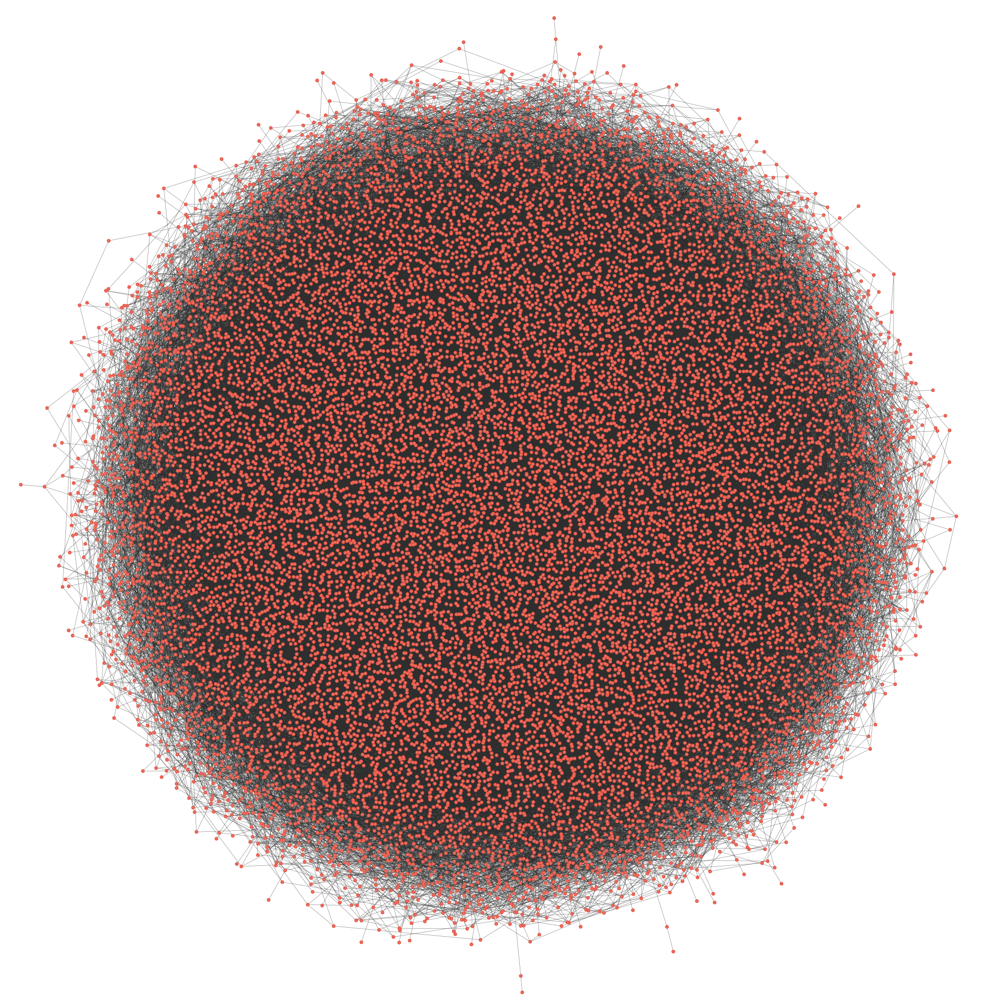

In [41]:

config_random_network = {
    # Input/output
    'zoom': 0.6,
    # Physics
    'node_charge': -50,
    'node_gravity': 0.27,
    'link_distance': 15,
    'link_distance_variation': 0,
    'node_collision': True,
    'wiggle_nodes': False,
    'freeze_nodes': False,
    # Nodes
    'node_fill_color': '#e57468',
    'node_stroke_color': '#ea5545',
    'node_label_color': '#000000',
    'display_node_labels': False,
    'scale_node_size_by_strength': False,
    'node_size': 5,
    'node_stroke_width': 1,
    'node_size_variation': 0.5,
    # Links
    'link_color': '#2e2e2e',
    'link_width': 0.3,
    'link_alpha': 0.79,
    'link_width_variation': 0.5,
    # Thresholding
    'display_singleton_nodes': True,
    'min_link_weight_percentile': 0,
    'max_link_weight_percentile': 1
}

network, config = nw.visualize(largest_cc_random_network_subgraph, plot_in_cell_below=False, config=config_random_network)

fig, ax = nw.draw_netwulf(network, figsize=20)
plt.savefig("Random_network.pdf")

### Computational Social Scientist network:

In [37]:
largest_cc_coauthorship_network = max(nx.connected_components(coauthorship_network), key=len)
largest_cc_coauthorship_network_subgraph = coauthorship_network.subgraph(largest_cc_coauthorship_network).copy()

print(f"Original network: {coauthorship_network.number_of_nodes()} nodes, {coauthorship_network.number_of_edges()} edges")
print(f"Largest Connected Component: {largest_cc_coauthorship_network_subgraph.number_of_nodes()} nodes, {largest_cc_coauthorship_network_subgraph.number_of_edges()} edges")

Original network: 17833 nodes, 58544 edges
Largest Connected Component: 15923 nodes, 53832 edges


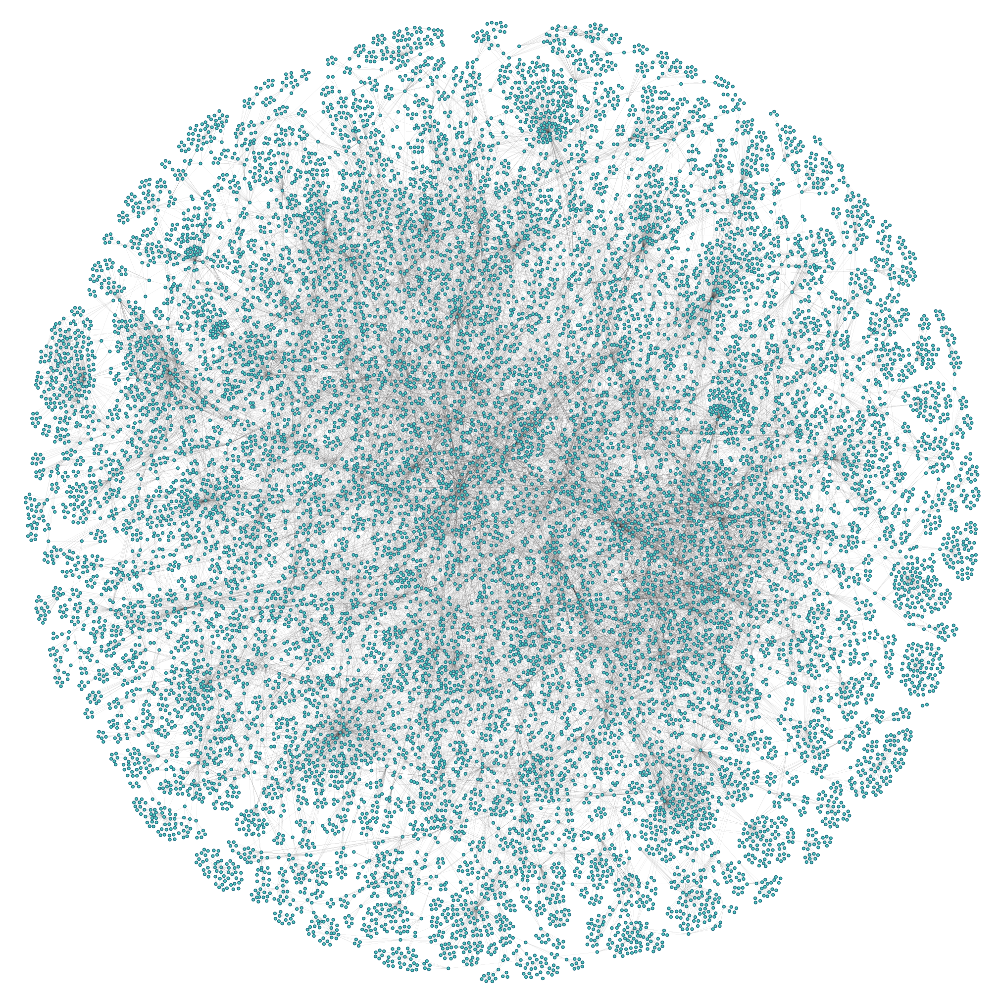

In [42]:
config_author_network = config_random_network.copy()
config_author_network.update({
    'node_fill_color': '#50d1c5',
    'node_stroke_color': '#2a7286'
    })

network, config_author_network = nw.visualize(largest_cc_coauthorship_network_subgraph, plot_in_cell_below=False, config=config_author_network)

fig, ax = nw.draw_netwulf(network, figsize=20)
plt.savefig("Coauthorship_network.pdf")

Both networks have been visualized using the Netwolf library and are displayed above. PDF's of the networks can be found in the 'Part 1 images' folder for super high detail inspection. 

In addition to these visualizations, degree distributions are visualized as well.

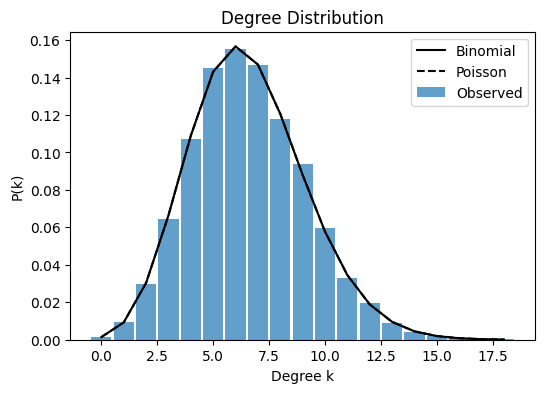

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import binom, poisson

def plot_degree_distribution(G, N, p):
    degrees = [d for n, d in G.degree()]
    hist, bins = np.histogram(degrees, bins=range(max(degrees)+2), density=True)

    plt.figure(figsize=(6, 4))
    plt.bar(bins[:-1], hist, width=0.9, alpha=0.7, label="Observed")
    
    # Binomial distribution
    k = np.arange(0, max(degrees) + 1)
    binom_dist = binom.pmf(k, N-1, p)
    plt.plot(k, binom_dist, 'k-', label="Binomial")
    
    # Poisson approximation
    lambda_ = p * (N - 1)
    poisson_dist = poisson.pmf(k, lambda_)
    plt.plot(k, poisson_dist, 'k--', label="Poisson")
    
    plt.xlabel("Degree k")
    plt.ylabel("P(k)")
    plt.legend()
    plt.title("Degree Distribution")
    plt.show()

plot_degree_distribution(random_network, N, p)


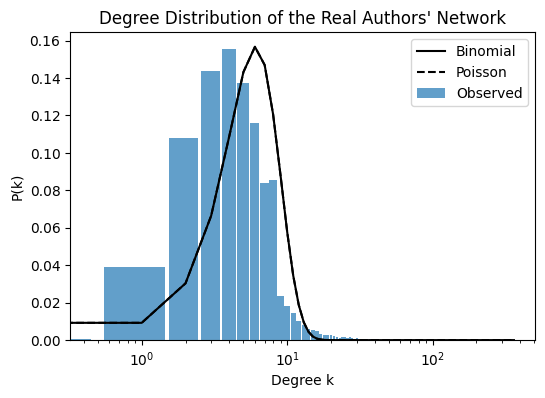

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from scipy.stats import binom, poisson

def plot_degree_distribution(G):
    degrees = [d for n, d in G.degree()]
    hist, bins = np.histogram(degrees, bins=range(max(degrees) + 2), density=True)
    
    plt.figure(figsize=(6, 4))
    plt.bar(bins[:-1], hist, width=0.9, alpha=0.7, label="Observed")
    
    N = G.number_of_nodes()
    L = G.number_of_edges()
    p = (2 * L) / (N * (N - 1)) 
    
    k = np.arange(0, max(degrees) + 1)
    binom_dist = binom.pmf(k, N-1, p)
    poisson_dist = poisson.pmf(k, p * (N - 1))
    
    plt.plot(k, binom_dist, 'k-', label="Binomial")
    plt.plot(k, poisson_dist, 'k--', label="Poisson")
    
    plt.xlabel("Degree k")
    plt.ylabel("P(k)")
    plt.xscale('log')
    plt.legend()
    plt.title("Degree Distribution of the Real Authors' Network")
    plt.show()


plot_degree_distribution(coauthorship_network)


* Answer the following questions __(max 200 words in total)__:

$\quad$ - What regime does your random network fall into? Is it above or below the critical threshold?

We calculate the average degree of a node in the network $\langle k\rangle$:

$$\langle k\rangle=\frac{2 \times 58544}{17833} \approx 6.57$$

Since $\langle k\rangle>1$, the network falls into the supercritical regime, and our network is above the critical threshold. In this regime, a giant component should emerge that contains a finite fraction of all nodes.

$\quad$ - According to the textbook, what does the network's structure resemble in this regime?

In this regime, a giant component forms, containing a significant fraction of all nodes. While most nodes are connected, some isolated nodes and small components still exist. 

Since $\ln 17833 \approx 9.79$ and $\langle k\rangle<\ln N$, the network is not fully connected-meaning that although a dominant cluster is present, some nodes remain in disconnected components. This aligns with our calculations from the visualization task.


$\quad$ - Based on your visualizations, identify the key differences between the actual and the random networks. Explain whether these differences are consistent with theoretical expectations.

The network visualizations show that the random network has a more even link distribution, as each node has the same probability of forming edges. In contrast, the coauthorship network has varying node degrees, resulting in a denser center and clearer patterns. The degree distribution plot supports this, with the random network likely following a binomial distribution, while the coauthorship network appears more heavy-tailed.










2. _Shortest Paths_: Here, we will check if the Computational Social Scientists Network exhibits characteristics of a small-world network by analyzing its shortest paths.


Begin by identifying the largest connected component within the Computational Social Scientists network. Recall that a connected component is a subset of nodes in which every pair of nodes is connected by a path. For a refresher on connected components, see section 2.9 of the Network Science book. Follow these steps:


- Utilize [``nx.algorithms.connected_components``](https://networkx.org/documentation/stable//reference/algorithms/generated/networkx.algorithms.components.connected_components.html) to enumerate all connected components, which will be returned as a list of node subsets.

In [12]:
connected_components = list(nx.connected_components(coauthorship_network))

The connected components are returned as a list of node subsets. Some key statistics are printed for control:

In [43]:
print(f'Number of components within the Computational Social Scientists network: {len(connected_components)}')
size_list = [len(component) for component in connected_components]
sorted_size_decending = sorted(size_list,reverse=True)
print(f'Sizes of each component (decending by size): {sorted_size_decending}')

Number of components within the Computational Social Scientists network: 211
Sizes of each component (decending by size): [15923, 63, 59, 45, 39, 34, 31, 31, 30, 30, 29, 26, 25, 23, 22, 21, 20, 20, 19, 19, 19, 19, 18, 18, 17, 17, 17, 17, 17, 16, 15, 15, 15, 15, 14, 14, 14, 13, 13, 13, 13, 13, 13, 13, 13, 12, 12, 12, 12, 12, 12, 12, 12, 12, 11, 11, 11, 11, 11, 11, 11, 11, 10, 10, 10, 10, 10, 10, 10, 10, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1]


- Select the largest subset of nodes identified in the previous step. Then, create a subgraph of your original network that includes only these nodes, using [``nx.Graph.subgraph``](https://networkx.org/documentation/stable/reference/classes/generated/networkx.Graph.subgraph.html). This subset forms your largest connected component, sometimes referred to as the [giant component](https://en.wikipedia.org/wiki/Giant_component).


We extract the largest connected component, which we found to be of size 15923.

In [14]:
largest_cc = max(connected_components, key=len)

giant_component = coauthorship_network.subgraph(largest_cc).copy()

print(giant_component) # size security check

Graph with 15923 nodes and 53832 edges


* Calculate the average (unweighted) shortest path length within this giant component by employing [``nx.average_shortest_path_length``](https://networkx.org/documentation/networkx-1.3/reference/generated/networkx.average_shortest_path_length.html).


In [44]:
average_shortest_path_length = nx.average_shortest_path_length(giant_component)
print(average_shortest_path_length)

5.950953386612338


The average unweighted shortest path length within the giant component is $\approx5.95$

* Perform the same calculation for the giant component of the random network you constructed in the above exercise 1.


In [45]:
connected_components_random= list(nx.connected_components(random_network))

print(f'Number of components within the random network: {len(connected_components_random)}')
size_list = [len(component) for component in connected_components_random]
sorted_size_decending = sorted(size_list,reverse=True)
print(f'Sizes of each component (decending by size): {sorted_size_decending}')

Number of components within the random network: 23
Sizes of each component (decending by size): [17811, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


In [46]:
largest_cc_random = max(connected_components_random, key=len)

giant_component_random = random_network.subgraph(largest_cc_random).copy()

print(giant_component_random)

Graph with 17811 nodes and 58750 edges


In [47]:
average_shortest_path_length_random = nx.average_shortest_path_length(giant_component_random)
print(average_shortest_path_length_random)

5.409868022496239


The average unweighted shortest path length within the giant component is $\approx5.41$ for the random network


* Reflect on how the average shortest path lengths of the real and random networks compare and answer the following questions, supporting your answers with the theory from the book.


- Why do you think I asked you to consider the giant component only?

By ensuring that we analyze only a fully connected subgraph where every node can reach every other node, we avoid the issue of disconnected components. If smaller, disconnected components were included, many pairs of nodes would be unreachable, resulting in an infinite shortest path length between them.

- Why do you think I asked you to consider unweighted edges?


We consider unweighted edges because we are focusing on the network's structural properties, such as connectivity and path length, rather than the strength or intensity of individual connections. In small-world networks, the key interest is in the number of steps needed to traverse the network, and the varying levels of interaction between nodes (e.g. authors) are less relevant to this measure.

- Does the Computational Social Scientists network exhibit the small-world phenomenon?

From the book's discussion on random vs. real networks, we know that a network is small-world if it satisfies the following two conditions:

If our computational social scientist networks average length is similar to that of a random network, but the Clustering Coefficient is significantly higher for the real network than for the random network: 

This is because social networks typically exhibit high clustering because people form groups, whereas it is low for random networks since connections are made arbitrarily.

Thus, we consider the clustering coeffecient for both networks to test for the small world property:

In [53]:
clustering_real = nx.average_clustering(giant_component)
clustering_random = nx.average_clustering(giant_component_random)
print(f'Clustering coeffecient for the computational social scientist network:',clustering_real)
print(f'Clustering coeffecient for the random network:',clustering_random)

Clustering coeffecient for the computational social scientist network: 0.8222685388147903
Clustering coeffecient for the random network: 0.00022217374043905565


Since the clustering coeffecient is much greater for the computational social scientist network, and they both had around the same average shortest path length, we conclude that the computational social scientist network exhibits the small-world phenomenon.

# `Part 2:` Network Analysis in Computational Social Science


# `Part 3:` Words that characterize Computational Social Science communities
